<h1 align="center">Restaurants Analytics</h1>

<br>

Importing essential libraries and loading the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [2]:
df = pd.read_csv('Dataset.csv')

<br>

## Level 1

### Task 1: Data Exploration and Preprocessing

In [3]:
df.head(3)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

<br>
The dataset contains 21 columns and 9551 rows, with no data type conversions required.
<br>
<br>

In [5]:
df.isna().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [6]:
df = df.dropna().reset_index(drop=True)

<br>
Missing values removed.
<br>
<br>

In [7]:
df[df.duplicated('Restaurant ID')]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes


<br>
No duplicate rows.
<br>
<br>

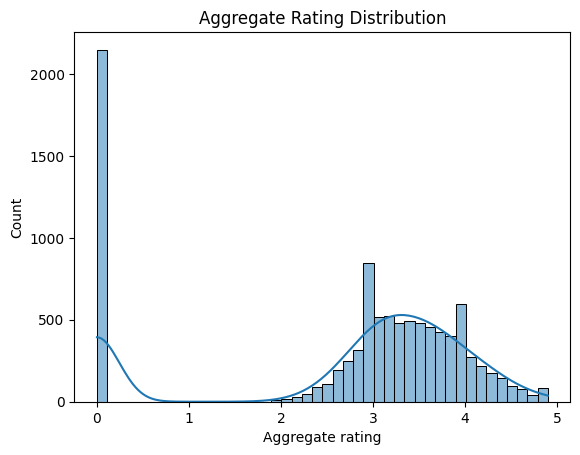

In [8]:
sns.histplot(df['Aggregate rating'], kde = True)
plt.title('Aggregate Rating Distribution')
plt.show()

<br>
A left-skewed distribution was observed for the target variable "Aggregate rating," with a significant class imbalance favoring 0 rating over others.
<br>
<br>

### Task 2:Descriptive Analysis

In [9]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000
mean,9.043301e+06,18.179208,64.274997,25.848532,1200.326137,1.804968,2.665238,156.772060
std,8.791967e+06,56.451600,41.197602,11.010094,16128.743876,0.905563,1.516588,430.203324
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019312e+05,1.000000,77.081565,28.478658,250.000000,1.000000,2.500000,5.000000
50%,6.002726e+06,1.000000,77.192031,28.570444,400.000000,2.000000,3.200000,31.000000
75%,1.835260e+07,1.000000,77.282043,28.642711,700.000000,2.000000,3.700000,130.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [10]:
country_code_count = df['Country Code'].value_counts()
country_code_count

Country Code
1      8652
216     425
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64

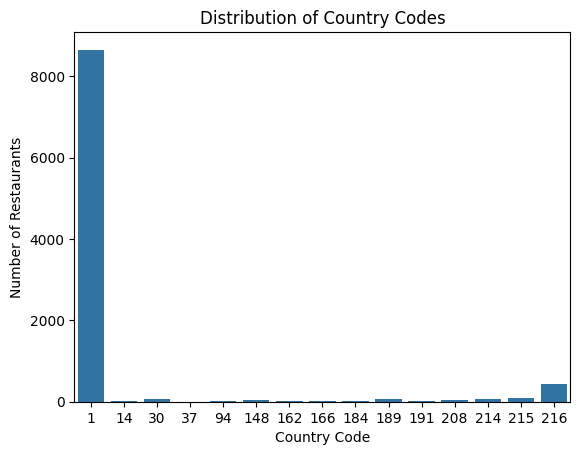

In [11]:
sns.countplot(x='Country Code', data=df)
plt.title('Distribution of Country Codes')
plt.ylabel("Number of Restaurants")
plt.show()


In [12]:
city_count = df['City'].value_counts()
city_count

City
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lincoln              1
Lakeview             1
Lakes Entrance       1
Inverloch            1
Panchkula            1
Name: count, Length: 140, dtype: int64

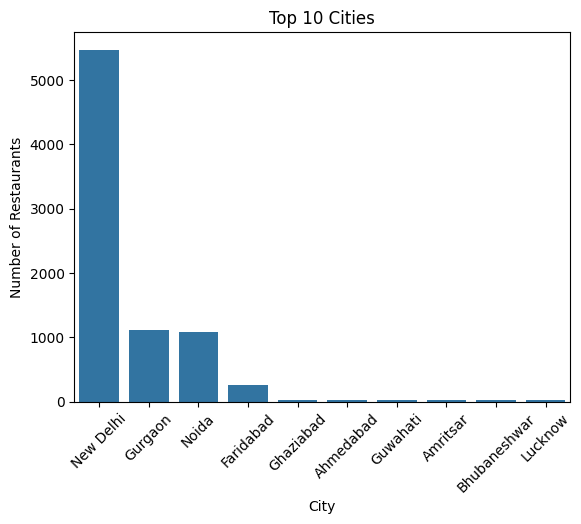

In [13]:
sns.countplot(x='City', data=df, order=df['City'].value_counts().head(10).index)
plt.title('Top 10 Cities')
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=45)
plt.show()

In [14]:
cuisine = [i.split(', ') for i in df['Cuisines']]                              # Splitting each cuisine string
cuisine = pd.Series([i for sublist in cuisine for i in sublist])

In [15]:
cuisine_count = cuisine.value_counts()
cuisine_count

North Indian      3960
Chinese           2735
Fast Food         1986
Mughlai            995
Italian            764
                  ... 
Fish and Chips       1
Malwani              1
Cuisine Varies       1
Soul Food            1
B�_rek               1
Name: count, Length: 145, dtype: int64

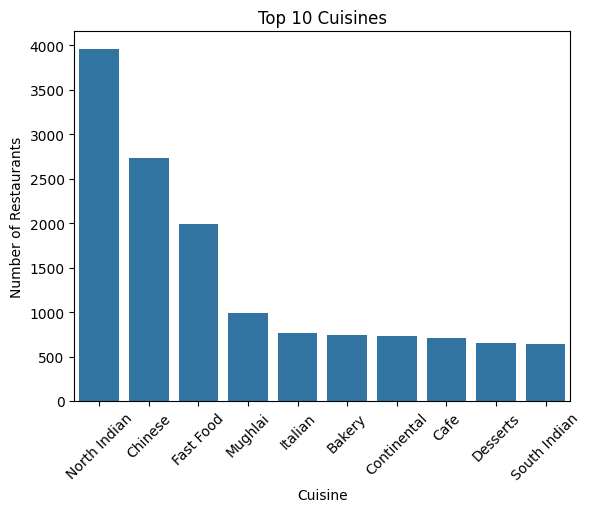

In [16]:
sns.countplot(x=cuisine, order=cuisine.value_counts().head(10).index)
plt.title('Top 10 Cuisines')
plt.xlabel('Cuisine')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)
plt.show()

<br>

### Task 3: Geospatial Analysis

In [17]:
m = folium.Map(location=[0,0], zoom_start=2.4)

In [18]:
marker_cluster = MarkerCluster().add_to(m)
for index, row in  df[(df['Longitude'] != 0) & (df['Latitude'] != 0)].iterrows():
    latitude = row['Latitude']
    longitude = row['Longitude']
    popup_text = f"<b>Restaurant:</b> {row['Restaurant Name']}"
    folium.Marker([latitude, longitude], popup= popup_text).add_to(marker_cluster)

m

<br>
Based on the map visualization, India appears to have the most restaurants among the countries analyzed, with New Delhi leading in terms of city-level distribution.
<br>
<br>

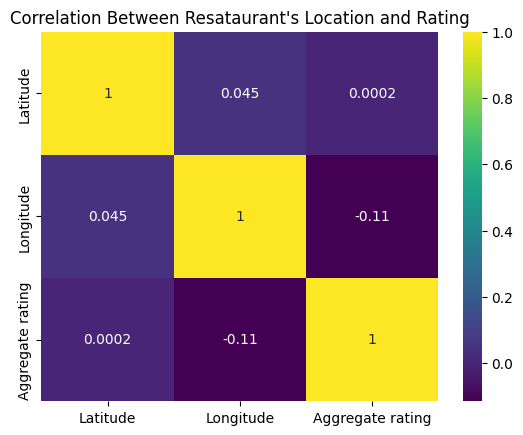

In [19]:
sns.heatmap(df[['Latitude', 'Longitude', 'Aggregate rating']].corr(), annot=True, cmap='viridis')
plt.title("Correlation Between Resataurant's Location and Rating")
plt.show()

<br>
The correlation heatmap indicates that there is no significant relationship between a restaurant's location and its rating.
<br>
<br>